In [50]:
%reload_ext autoreload
%autoreload 2

In [51]:
from model import *
from preprocessing import *
from utils import *
from PIL import Image, ImageFilter

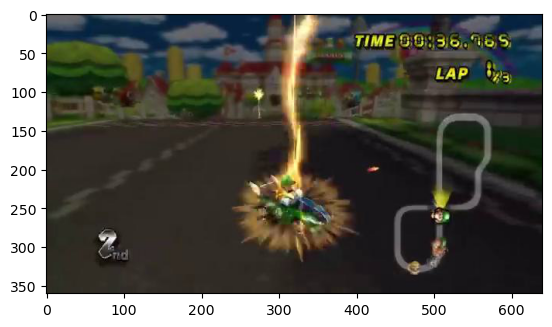

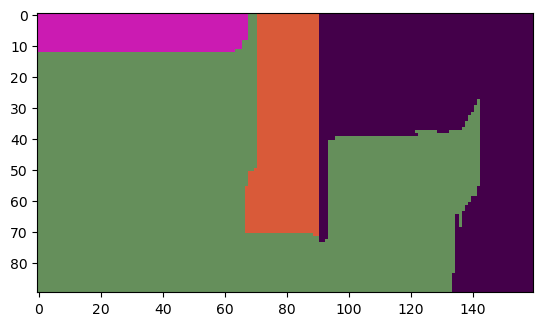

In [41]:
import PIL
sigma = 7
neighbor = 4
K = 1e-2
min_comp_size = 800


input_file ='../img/mario_in/mario_in_1.JPG'
output_file = '../img/mario_out.JPG'

init_image = PIL.Image.open(input_file).convert("RGB")
plt.imshow(init_image)
plt.show()
fac=4
original_image = init_image.resize((int(init_image.size[0]/fac),int(init_image.size[1]/fac)))

width= original_image.size[1]
height= original_image.size[0]

forest=get_segmented_image(sigma, neighbor, K, min_comp_size, original_image)

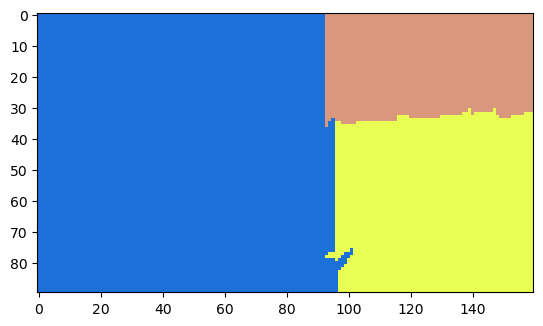

In [32]:
sigma = 10
neighbor = 4
K = 1e-2
min_comp_size = 800

# frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
# init_image = PILImage.fromarray(frame_rgb).convert("RGB")
fac=4

# filename = f'mario_in_{i}.JPG'
# filepath = os.path.join('../img/mario_in', filename)
# init_image.save(filepath)
init_image = PIL.Image.open(input_file)

pil_image = init_image.resize((int(init_image.size[0]/fac),int(init_image.size[1]/fac)))

forest=get_segmented_image(sigma, neighbor, K, min_comp_size, pil_image)

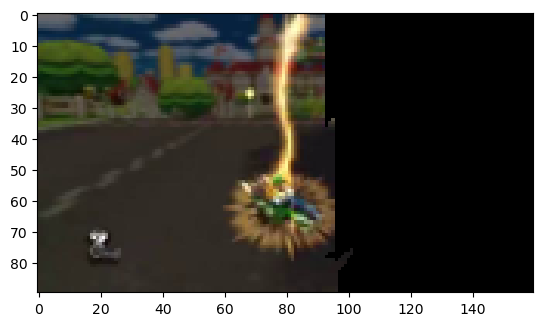

In [33]:
import matplotlib.pyplot as plt

mask=get_mask(forest,original_image)
new_image= np.array(original_image)
new_image[mask == 0] = [0, 0, 0]
plt.imshow(new_image)
plt.show()

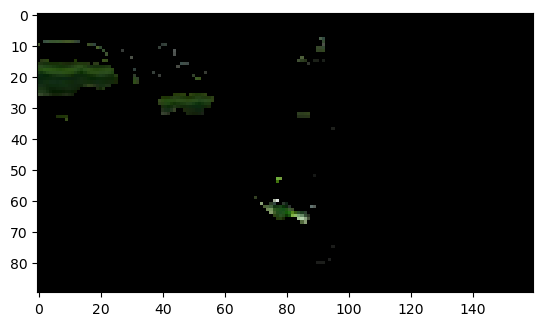

In [34]:
green_mask=get_green_mask(new_image,hue_range=(43, 85))
im=new_image.copy()
im[green_mask == 0] = [0, 0, 0]
plt.imshow(im)
plt.show()

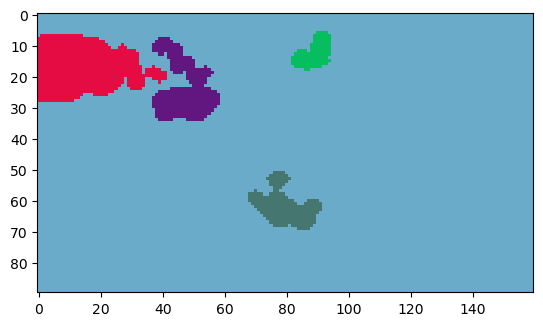

In [35]:
sigma = 1 #30
neighbor = 8 #8
K = 1e3 #1
min_comp_size = 100 #100
forest=get_segmented_image(1, neighbor, K, min_comp_size, im)

Composante 7161: Distance au point défini = 31.339517830845733
Composante 8204: Distance au point défini = 36.56345036312069
Composante 3518: Distance au point défini = 62.83595868413379
Composante 277: Distance au point défini = 94.63526343869974


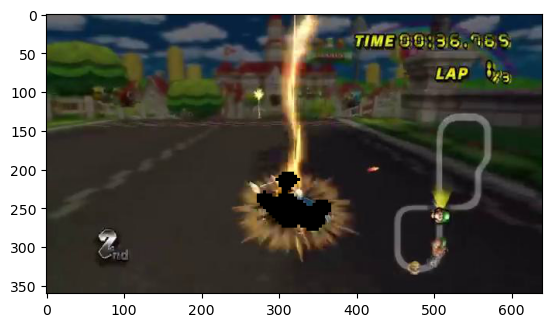

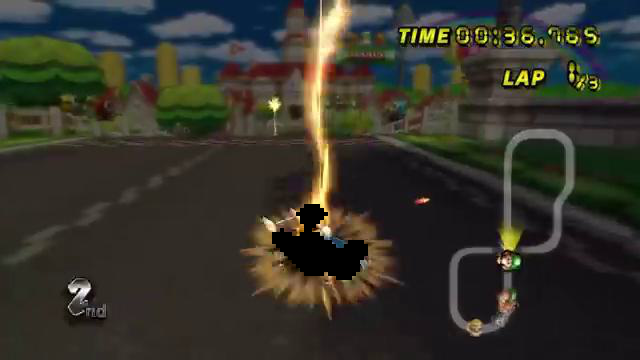

In [38]:
nice_plot_ter(forest, init_image, original_image,fac)

Composante 7161: Distance au point défini = 31.339517830845733
Composante 8204: Distance au point défini = 36.56345036312069
Composante 3518: Distance au point défini = 62.83595868413379


/var/folders/jg/xwrf3zlx2h3gz5_9mw2__my40000gn/T/ipykernel_65546/2621495424.py:36: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of 256 to uint8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)
will give the desired result (the cast overflows).
  new_image[mask_big == 1] = [g, g, g]


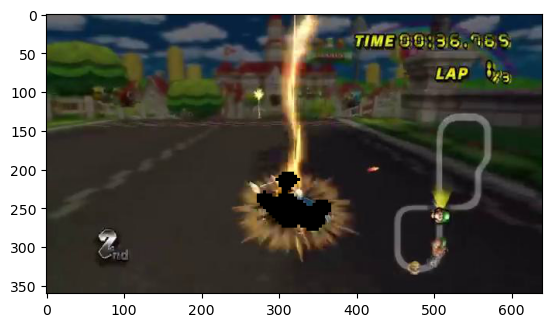

In [36]:
from collections import defaultdict

height,width = original_image.size

components_points = defaultdict(list)
components_centers = {}

for y in range(height):
    for x in range(width):
        comp = forest.find(y * width + x)        
        components_points[comp].append((x, y))

for comp, points in components_points.items():
    avg_x = sum(point[0] for point in points) / len(points)
    avg_y = sum(point[1] for point in points) / len(points)
    
    components_centers[comp] = (avg_x, avg_y)

filtered_components = {comp: points for comp, points in components_points.items() if len(points) < 500}

centre_x = width // 2
centre_y = height *2 // 3

distances = {comp: ((centre_x - center[0]) ** 2 + (centre_y - center[1]) ** 2) ** 0.5 for comp, center in components_centers.items() if comp in filtered_components}
sorted_components = sorted(distances.items(), key=lambda x: x[1])

for comp, distance in sorted_components:
    print(f"Composante {comp}: Distance au point défini = {distance}")

mask = np.zeros((width,height))
g=256
for points in components_points[sorted_components[0][0]]:
                mask[points] = 1
mask_big = cv2.resize(mask, (fac*height, fac*width), interpolation=cv2.INTER_NEAREST)
new_image = np.array(init_image)
new_image[mask_big == 1] = [g, g, g]
new_image=PILImage.fromarray(new_image).convert("RGB")
plt.imshow(new_image)
plt.show()


160 90


/var/folders/jg/xwrf3zlx2h3gz5_9mw2__my40000gn/T/ipykernel_65546/795959020.py:26: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of 256 to uint8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)
will give the desired result (the cast overflows).
  new_image[mask_big == 1] = [g, g, g]


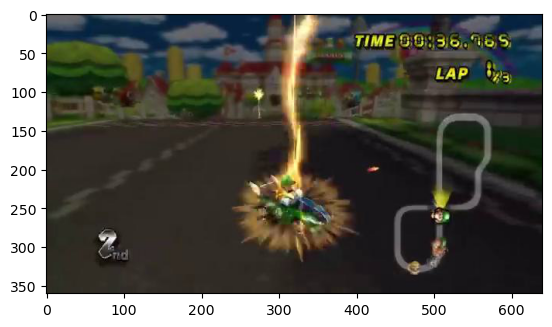

In [37]:
comp_list=[]
height,width = original_image.size
print(height,width)
for y in range(height):
    for x in range(width):
        comp = forest.find(y * width + x)
        comp_list.append(comp)
unique, counts = np.unique(comp_list, return_counts=True)
dictio=dict(zip(unique, counts))
cle_minimum = max(dictio, key=dictio.get)

centre_x = width // 2
centre_y = height *2 // 3
r = int(min(width, height) * 0.2)

mask = np.zeros((width,height))
g=256
for y in range(height):
    for x in range(width):
        if comp_list[y * width + x] != cle_minimum and dictio[comp_list[y * width + x]] < 400:
            if math.sqrt((x - centre_x) ** 2 + (y - centre_y) ** 2) <= r:
        # if dictio[comp_list[y * width + x]] < 400 and y>30 and y<130:
                mask[x, y] = 1
mask_big = cv2.resize(mask, (fac*height, fac*width), interpolation=cv2.INTER_NEAREST)
new_image = np.array(init_image)
new_image[mask_big == 1] = [g, g, g]
new_image=PILImage.fromarray(new_image).convert("RGB")
plt.imshow(new_image)
plt.show()

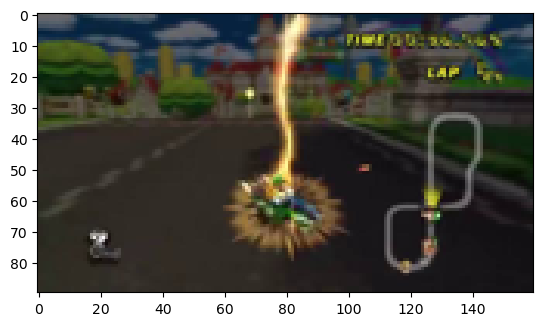

In [20]:
comp_list=[]
height,width = original_image.size
for y in range(height):
    for x in range(width):
        comp = forest.find(y * width + x)
        comp_list.append(comp)
unique, counts = np.unique(comp_list, return_counts=True)
dictio=dict(zip(unique, counts))
cle_minimum = min(dictio, key=dictio.get)

ima = original_image.convert("RGBA")
g=256
for y in range(height):
    for x in range(width):
        # if comp_list[y * width + x] == cle_minimum:
        if dictio[comp_list[y * width + x]] < 300 and y>30 and y<130:
            ima.putpixel((y, x), (g, g, g))
plt.imshow(ima)
plt.show()

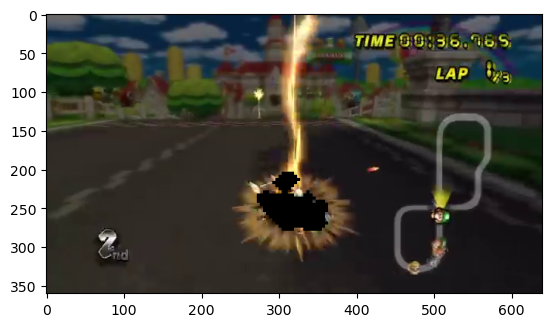

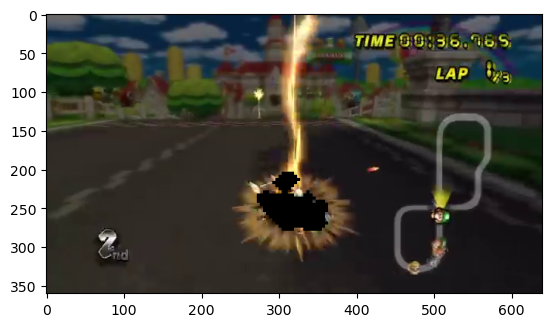

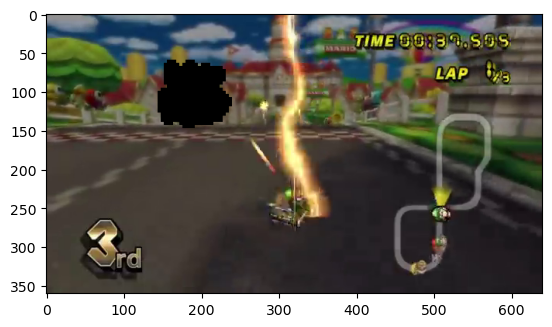

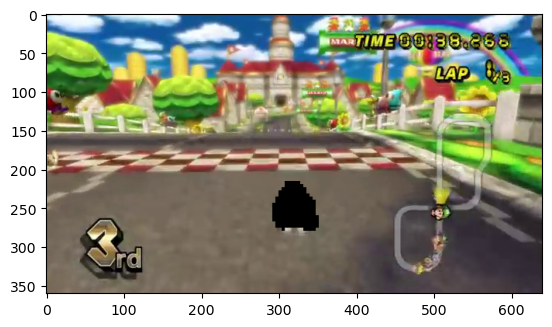

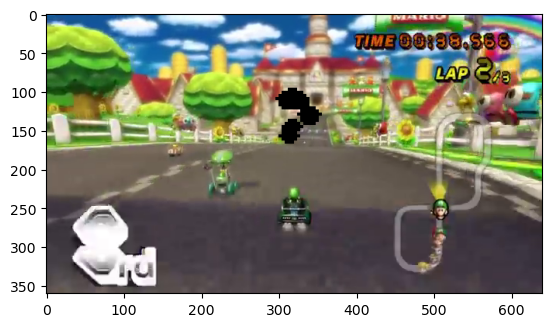

...

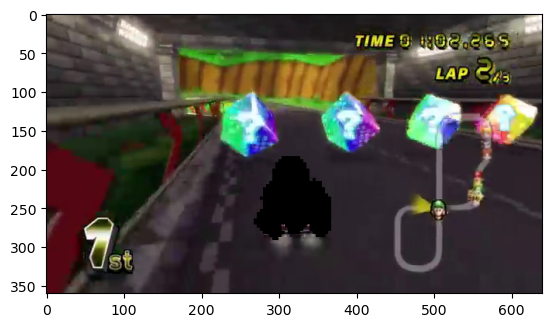

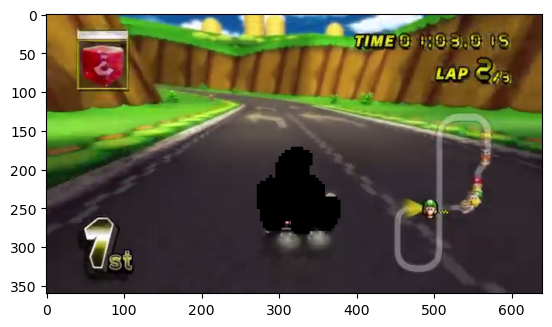

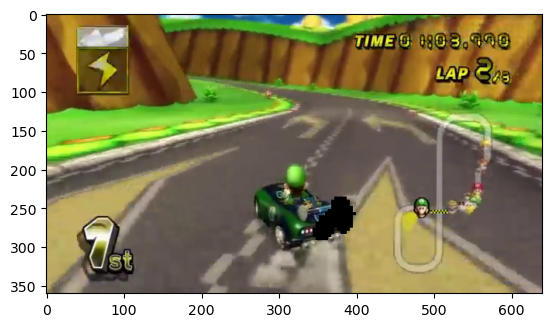

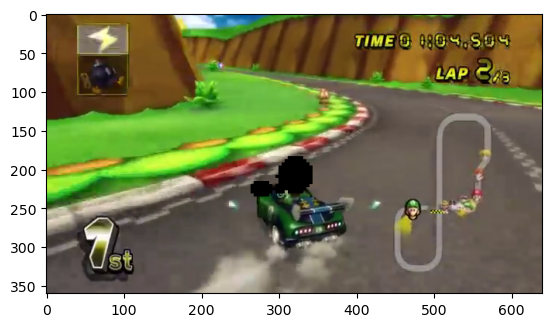

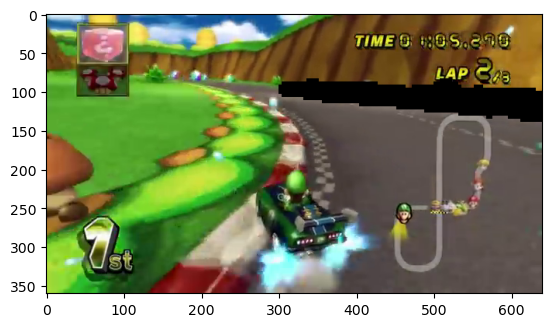

In [52]:
import cv2
from PIL import Image as PILImage
import io

def iterate_frames(video_path, start_time, end_time, num_frames, output_folder):
    cap = cv2.VideoCapture(video_path)
    fps = cap.get(cv2.CAP_PROP_FPS)

    start_frame = int(start_time * fps)
    end_frame = int(end_time * fps)

    cap.set(cv2.CAP_PROP_POS_FRAMES, start_frame)

    for i in range(num_frames):
        ret, frame = cap.read()
        cap.set(cv2.CAP_PROP_POS_FRAMES, start_frame + i * (end_frame - start_frame) // num_frames)
        if ret:
            sigma = 7
            neighbor = 4
            K = 1e-2
            min_comp_size = 800

            frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            init_image = PILImage.fromarray(frame_rgb).convert("RGB")
            fac=4

            filename = f'mario_in_{i}.JPG'
            filepath = os.path.join('../img/mario_in', filename)
            init_image.save(filepath)

            pil_image = init_image.resize((int(init_image.size[0]/fac),int(init_image.size[1]/fac)))

            forest=get_segmented_image(sigma, neighbor, K, min_comp_size, pil_image)
            mask=get_mask(forest,pil_image)
            new_image= np.array(pil_image)
            new_image[mask == 0] = [0, 0, 0]
            green_mask=get_green_mask(new_image,hue_range=(40, 85))
            im=new_image.copy()
            im[green_mask == 0] = [0, 0, 0]
            sigma = 1
            neighbor = 8
            K = 1e3 
            min_comp_size = 100 
            forest=get_segmented_image(sigma, neighbor, K, min_comp_size, im)
            frame=nice_plot_ter(forest, init_image,pil_image,fac)

            filename = f'mario_{i}.JPG'
            filepath = os.path.join(output_folder, filename)
            frame.convert("RGB").resize((int(pil_image.size[0]*fac),int(pil_image.size[1]*fac))).save(filepath)
            
        else:
            print("Fin de la vidéo.")
            break
    cap.release()

video_path = '../video/Mario_Kart.mp4'
t1 = 60 + 23
t2 = 60 + 53 

num_frames = 40
output_folder = '../img/mario_out/'

iterate_frames(video_path, t1, t2, num_frames, output_folder)


In [53]:
import os
import moviepy.video.io.ImageSequenceClip
image_folder = '../img/mario_out/'
fps=2

image_files = [os.path.join(image_folder,img)
               for img in os.listdir(image_folder)
               if img.endswith(".JPG")]
clip = moviepy.video.io.ImageSequenceClip.ImageSequenceClip(image_files, fps=fps)
clip.write_videofile('../img/mario_out/my_video.mp4')

Moviepy - Building video ../img/mario_out/my_video.mp4.
Moviepy - Writing video ../img/mario_out/my_video.mp4



Moviepy - Done !
Moviepy - video ready ../img/mario_out/my_video.mp4


In [13]:
import numpy as np
import cv2
from PIL import Image, ImageDraw

def plot_circle_over_image(image_path):
    # Charger l'image à partir du chemin spécifié
    image = Image.open(image_path)
    width, height = image.size

    # Créer un dessin sur l'image
    draw = ImageDraw.Draw(image)

    # Calculer le centre et le rayon du cercle
    centre_x = width // 2
    centre_y = height *2 // 3
    rayon = int(min(width, height) * 0.2)

    # Dessiner un cercle sur l'image
    draw.ellipse((centre_x - rayon, centre_y - rayon, centre_x + rayon, centre_y + rayon), outline="red")

    # Enregistrer l'image avec le cercle dessiné
    image.save("image_with_circle.png")

    # Afficher l'image
    image.show()

# Utilisation du script
image_path = '../img/mario_out/mario_9.JPG'
plot_circle_over_image(image_path)


To do : donner des importances différentes aux aretes pour garder une memoire de où est luigi. Tenir compte de la vitesse, ou alors mettre en place un rayon